# Qui êtes-vous ?
<div class="alert alert-block alert-info">
Écrire ci-dessous votre nom, prénom et numéro étudiant :
</div>

* BENHADDAD Sabrina - 21200140
* BENSIDHOUM Azzedine - 21215880

# TME 10- LIME / SHAP

<div class="alert alert-block alert-warning">
L'objet de ce TME est de tester les algorithmes LIME et SHAP sur des tâches de classification assez simple.
</div>

In [1]:
import numpy as np
import pandas as pd
from tqdm import tqdm

from sklearn.datasets import load_breast_cancer
from sklearn.datasets import make_moons
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,f1_score,confusion_matrix, classification_report

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid', {'legend.frameon':True, 'legend.facecolor': 'white'})

## 1 - Préparation du dataset


<div class="alert alert-block alert-warning">
Utiliser le dataset <a href="https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+(Diagnostic)">UCI ML Breast Cancer Wisconsin (Diagnostic)</a>, comme dans le TME 3 et apprendre dessus un modèle linéaire de régression logistique
</div>

In [2]:
bc = load_breast_cancer()

df = pd.DataFrame(bc.data, columns = bc.feature_names)
df['target'] = bc.target
df

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,0
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,0
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,0
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,0


In [3]:
bc.target_names

array(['malignant', 'benign'], dtype='<U9')

In [4]:
X = bc.data
y = bc.target

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.25, random_state=0)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((426, 30), (143, 30), (426,), (143,))

In [5]:
logreg = LogisticRegression(class_weight='balanced', max_iter=10000).fit(X_train, y_train)
y_pred = logreg.predict(X_test)

In [6]:
print(f"Accuracy score du modèle : {round(accuracy_score(y_test,y_pred)*100,2)} %")
print(f"Score f1 : {round(f1_score(y_test,y_pred)*100,2)} %")

Accuracy score du modèle : 94.41 %
Score f1 : 95.4 %


## 2- Explication avec SHAP

<div class="alert alert-block alert-warning">
Nous allons étudier une explication donnée par SHAP.
</div>

In [ ]:
!pip install shap

<div class = "alert alert-block alert-info">
    Q2.1 - Exécuter le bloc ci-dessous pour obtenir les explications globales de SHAP. Commentez.
</div>

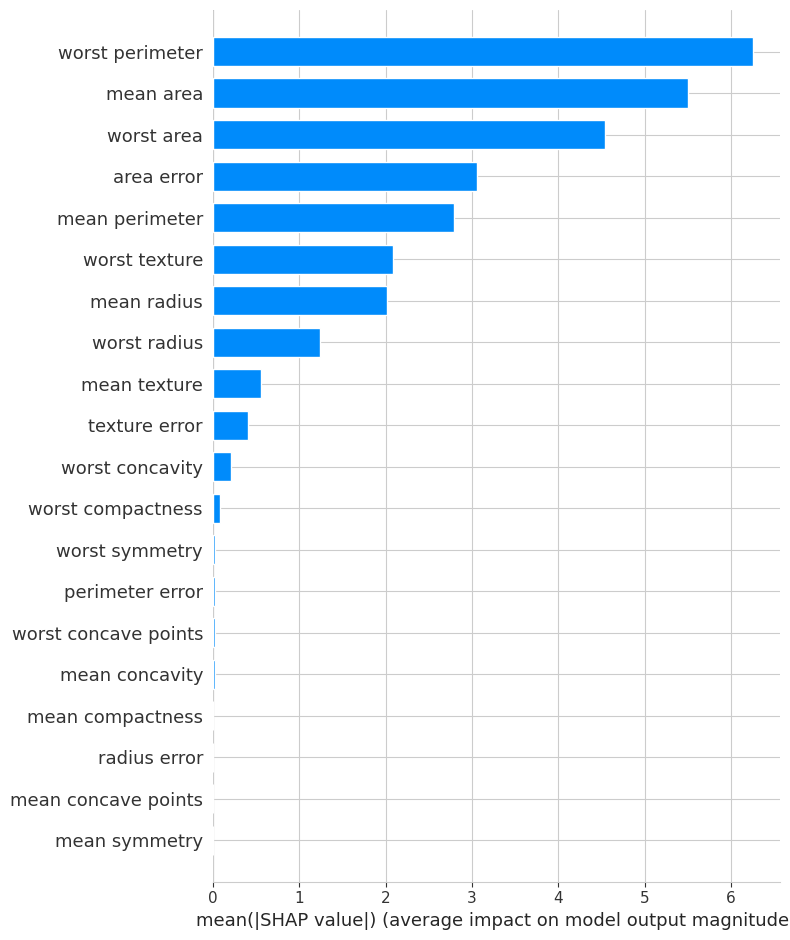

In [9]:
import shap

explainer = shap.LinearExplainer(logreg, X_train)
shap_values = explainer.shap_values(X_test)
feature_names = bc.feature_names

shap.summary_plot(shap_values, X_test, plot_type="bar", feature_names=feature_names)

Commentaire :     

La figure ci-dessous illustre un graphique en barres représentant l'importance relative des différents attributs dans la prédiction de notre modèle, selon SHAP.

Les valeurs de SHAP quantifient l'impact de chaque attribut sur la décision du modèle.

Nous pouvons constater que 'worst perimeter' est l'attribut le plus influent, suivi de 'mean area' et 'worst area', indiquant leur importance cruciale dans le modèle. Les moins influents sont 'radius error', 'mean concave points' et 'mean symmetry', suggérant que ces derniers ont un impact moindre sur la décision du modèle.

Cela met en lumière les caractéristiques clés qui dirigent la classification et peut guider l'amélioration future du modèle.

<div class = "alert alert-block alert-info">
    Q2.2 - Exécuter le bloc ci-dessous pour obtenir une explication locale avec SHAP du premier exemple de la base de test. Commentez.
</div>

In [10]:
bc.target_names

array(['malignant', 'benign'], dtype='<U9')

In [11]:
print("La classe prédite du premier exemple de la base de test est :",[y_pred[0]])
print(bc.target_names[y_pred[0]])

La classe prédite du premier exemple de la base de test est : [0]
malignant


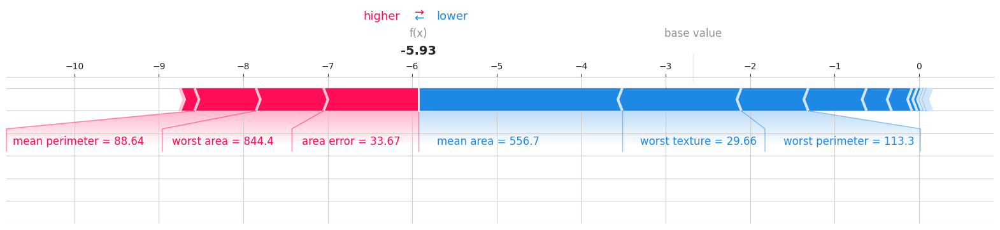

In [12]:
shap.initjs()
shap.force_plot(
    explainer.expected_value,
    shap_values[0, :],
    X_test[0, :],
    feature_names=feature_names,
    matplotlib=True
)

Commentaire :

Le graphique SHAP généré présente l'impact de chaque attribut sur la prédiction du premier exemple de la base de test par le modèle.

Les attributs en rouge, tels que le 'mean perimeter' et 'worst area', augmentent la probabilité que l'exemple soit classé comme malin(malignant), ils contribuent positivement, tandis que ceux en bleu, comme 'worst perimeter' et 'worst texture', contribuent à une classification non maligne (benign), autrement dit, ils contribuent négativement à la prédiction.

La ligne de base indique la valeur moyenne des prédictions sur l'ensemble des données.


L'attribut 'mean area', avec une valeur élevée, semble particulièrement significatif pour cette prédiction spécifique, suggérant que cet exemple a une probabilité plus élevée d'être classé comme malin. C'est un outil visuel puissant pour comprendre comment le modèle prend ses décisions pour des cas individuels, en illustrant l'effet net de chaque caractéristique sur le résultat prédit par rapport à la valeur de base.

<div class = "alert alert-block alert-info">
    Q2.3 - Comparer avec l'exemple suivant de la base de test.
</div>

In [13]:
print("La classe prédite de l'exemple suivant de la base de test est :",[y_pred[1]])
print(bc.target_names[y_pred[1]])

La classe prédite de l'exemple suivant de la base de test est : [1]
benign


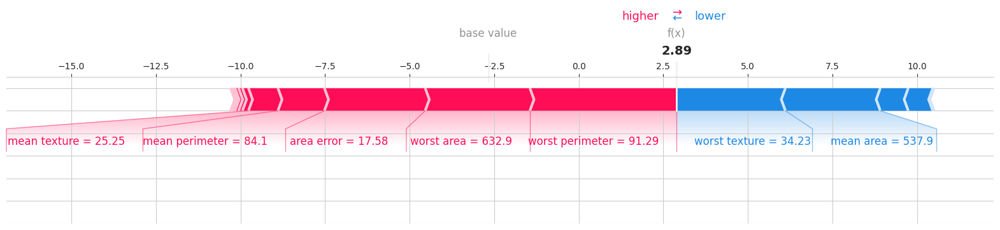

In [14]:
shap.force_plot(explainer.expected_value,
                shap_values[1, :],
                X_test[1,:],
                feature_names=feature_names,matplotlib=True)

Commentaire :

Pour cet exemple, nous pouvons constater que les attributs mean aera ainsi que worst texture contribuent négativement, tandis que les attributs worst perimeter ainsi que worst area contribuent positivement à la prédiction de cet exemple en tant que 'benign'

## 3 - Expérimentations

<div class="alert alert-block alert-warning">
    <ul>
        <li> Comparer les résultats fournis par LIME et SHAP sur des données identiques et commenter les résultats</li>
    <li> Examiner les résultats par exemple sur les données half-moons dans un cas où une explication linéaire est inappropriée et commenter</li>
    <li> Générer d'autres explications globales avec SHAP</li>
    <li> (facultatif) Modifier votre propre implémentation de LIME pour utiliser le noyau SHAP et comparer au résultat fourni par SHAP</li>
        </ul>
</div>

### A. Comparaison LIME / SHAP

#### LIME
Dans cette section, nous allons simplement utiliser LIME sur les données du dataset breast cancer préalablement utilisé, pour pouvoir comparer le résultat des deux algorithmes

In [ ]:
!pip install lime

In [16]:
from lime.lime_tabular import LimeTabularExplainer

explainer = LimeTabularExplainer(X_test,
    feature_names=feature_names,
    class_names=bc.target_names,
    categorical_features=[],
    mode='classification')


exp = explainer.explain_instance(X_test[0], logreg.predict_proba, num_features=10)

In [17]:
print("Prediction : ", logreg.predict(X_test[0].reshape(1,-1)))
print("Actual :     ", y_test[0])

Prediction :  [0]
Actual :      0


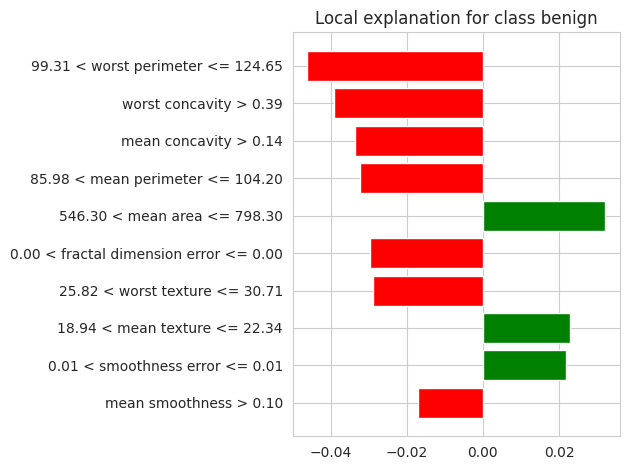

In [18]:
exp.as_pyplot_figure()
plt.tight_layout()

In [19]:
exp.as_list()

[('99.31 < worst perimeter <= 124.65', -0.046071926277492216),
 ('worst concavity > 0.39', -0.03917472755883865),
 ('mean concavity > 0.14', -0.03348481093083788),
 ('85.98 < mean perimeter <= 104.20', -0.03229976581667134),
 ('546.30 < mean area <= 798.30', 0.032095777210847755),
 ('0.00 < fractal dimension error <= 0.00', -0.029700758110474835),
 ('25.82 < worst texture <= 30.71', -0.02878369238992707),
 ('18.94 < mean texture <= 22.34', 0.02281190915819004),
 ('0.01 < smoothness error <= 0.01', 0.02191758171166142),
 ('mean smoothness > 0.10', -0.01696884848266402)]

In [20]:
exp.show_in_notebook(show_table=True)

#### SHAP
Utilisons à présent SHAP pour générer une explication sur le même exemple.

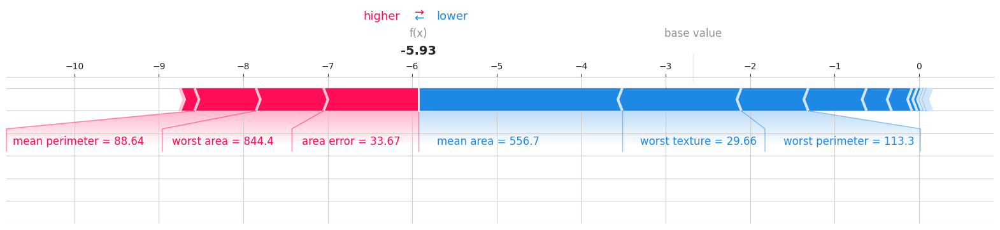

In [21]:
explainer = shap.LinearExplainer(logreg, X_train)

shap_values = explainer.shap_values(X_test)
shap.force_plot(
    explainer.expected_value,
    shap_values[0, :],
    X_test[0, :],
    feature_names=feature_names,
    matplotlib=True
)

Text(0.5, 1.0, 'Impact of each feature in the Logistic regression predictions')

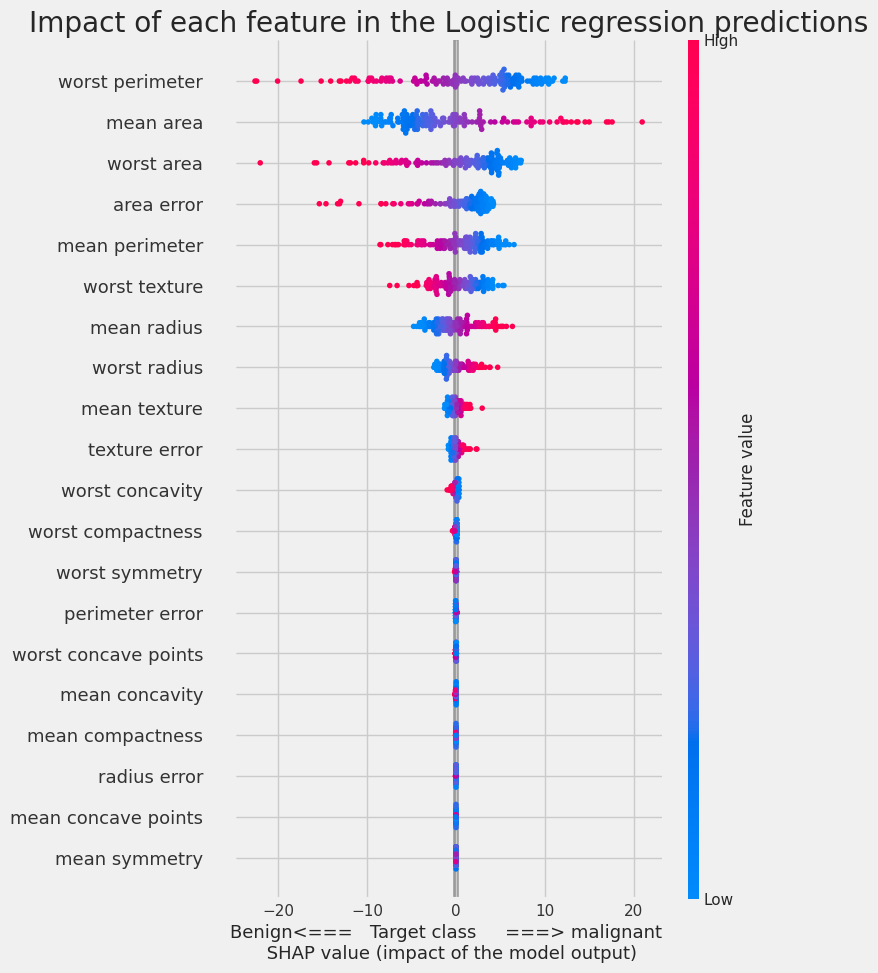

In [22]:
plt.style.use('fivethirtyeight')
shap.summary_plot(shap_values, X_test, feature_names=feature_names, show=False)
fig = plt.gcf()
ax = plt.gca()
ax.set_xlabel("Benign<===   Target class     ===> malignant \n SHAP value (impact of the model output)")
ax.set_title("Impact of each feature in the Logistic regression predictions")

Commentaire :

L'analyse LIME présente une explication ciblée pour un seul exemple de prédiction, identifiant les seuils pour des caractéristiques telles que le "worst perimeter" et la "worst texture" qui poussent la classification vers "benign". Les barres rouges et vertes indiquent respectivement les contributions négatives et positives des caractéristiques, offrant une indication claire de ce qui augmente ou diminue la probabilité d'être classé comme "benign" pour cet exemple spécifique.

La force plot SHAP pour cet exemple spécifique montre un spectre plus nuancé d'influences, avec des caractéristiques poussant la prédiction dans les deux sens (vers "benign" ou la classe opposée), et donne une indication de l'équilibre général de ces influences.

Le bee swarm plot SHAP élargit la perspective, illustrant comment chaque caractéristique affecte la prédiction pour l'ensemble du jeu de données. Chaque point représente l'impact d'une caractéristique sur une prédiction individuelle, et le positionnement sur l'axe horizontal montre l'étendue de cet impact, permettant d'apprécier les tendances générales et les exceptions.

En résumé, LIME est utile pour comprendre les prédictions au niveau local avec des indications précises sur les seuils des caractéristiques, tandis que SHAP fournit une compréhension à la fois locale et globale, montrant l'impact variable des caractéristiques à travers toutes les instances. Ensemble, ces méthodes révèlent que certaines caractéristiques ont un rôle cohérent dans le modèle, mais l'importance et la direction de leur influence peuvent varier considérablement d'un cas à l'autre.

### B. Explications sur données halfmoons + génération d'explications globales

In [23]:
X,y = make_moons(n_samples = 200, noise = 0.05, random_state = 42)


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train a simple logistic regression model
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

# Predictions and accuracy
y_pred = logreg.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)

In [24]:
accuracy

0.9

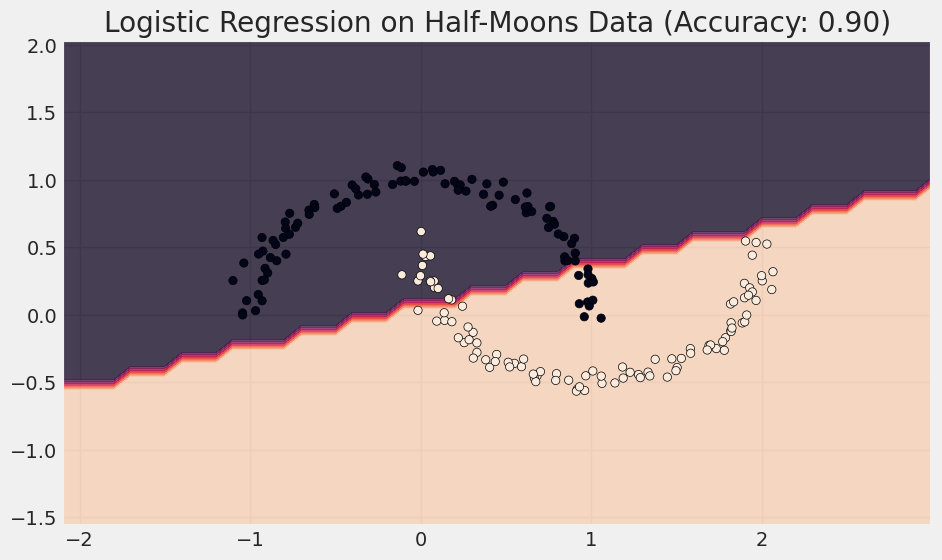

In [25]:
# Create a mesh grid for plotting decision boundary
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                     np.arange(y_min, y_max, 0.1))

# Plotting decision boundary
Z = logreg.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.figure(figsize=(10,6))
plt.contourf(xx, yy, Z, alpha=0.8)
plt.scatter(X[:, 0], X[:, 1], c=y, edgecolors='k')
plt.title('Logistic Regression on Half-Moons Data (Accuracy: {:.2f})'.format(accuracy))
plt.show()

Nous pouvons facilement remarquer, qu'un modèle linéaire n'est pas adapté à ce type de données.

Tentons tout de même d'appliquer LIME et SHAP pour obtenir une explication.

#### LIME

In [26]:
explainer = LimeTabularExplainer(
    training_data=X_train,
    feature_names=['x1', 'x2'],
    class_names=['Class 0', 'Class 1'],
    mode='classification'
)

Expliquons la prédiction du premier exemple de la base de test

In [27]:
print("La classe prédite de l'exemple suivant de la base de test est :",[y_pred[0]])
print("Actual ", y_test[0])

La classe prédite de l'exemple suivant de la base de test est : [1]
Actual  1


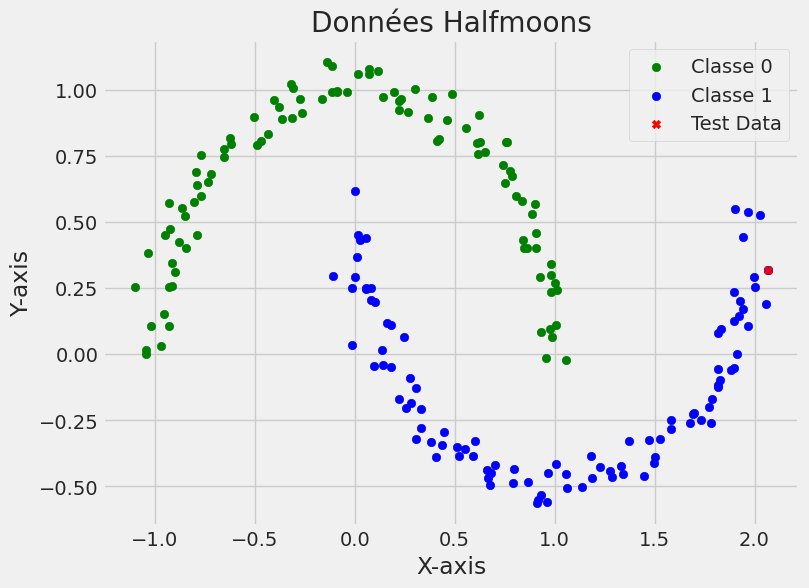

In [34]:
plt.figure(figsize=(8, 6))
plt.scatter(X[y == 0][:, 0], X[y == 0][:, 1], color='green', label='Classe 0')
plt.scatter(X[y == 1][:, 0], X[y == 1][:, 1], color='blue', label='Classe 1')
plt.scatter(X_test[0, 0], X_test[0, 1], marker='X', color='red', label='Test Data')
plt.title('Données Halfmoons')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend()
plt.show()


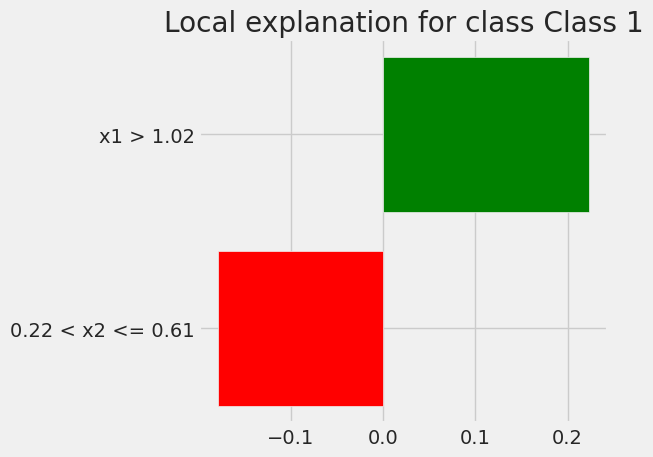

In [28]:
exp = explainer.explain_instance(X_test[0], logreg.predict_proba, num_features=2)
exp.as_pyplot_figure()
plt.tight_layout()
plt.show()

In [29]:
exp.as_list()

[('x1 > 1.02', 0.22372903911300404),
 ('0.22 < x2 <= 0.61', -0.17862768090346232)]

In [30]:
exp.show_in_notebook(show_table=True)

Test pour exemples mal classifiés

In [35]:
mal_class = np.where(y_pred != y_test)
mal_class

(array([ 2, 13, 35, 37, 40, 45]),)

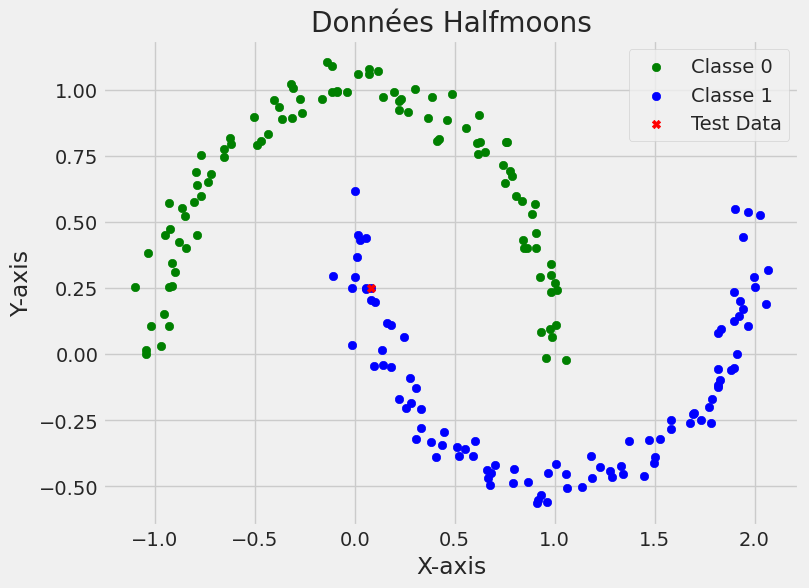

In [38]:
plt.figure(figsize=(8, 6))
plt.scatter(X[y == 0][:, 0], X[y == 0][:, 1], color='green', label='Classe 0')
plt.scatter(X[y == 1][:, 0], X[y == 1][:, 1], color='blue', label='Classe 1')
# Assuming X_test is a 2D array like X, we need to split it into X and Y components for plotting.
plt.scatter(X_test[35, 0], X_test[35, 1], marker='X', color='red', label='Test Data')
plt.title('Données Halfmoons')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend()
plt.show()


In [36]:
exp = explainer.explain_instance(X_test[35], logreg.predict_proba, num_features=2)
exp.as_list()

[('0.22 < x2 <= 0.61', -0.19143277906167527),
 ('0.00 < x1 <= 0.60', -0.05155962426250472)]

In [37]:
exp.show_in_notebook(show_table=True)

Les explications fournies par LIME pour le jeu de données "half-moons" montrent une influence négative de la caractéristique x1 et une influence positive de x2 sur la prédiction de la classe 1. Cependant, la non-linéarité des données "half-moons" rend les interprétations linéaires de LIME potentiellement limitées, car elles pourraient ne pas refléter l'interaction complexe des caractéristiques. Bien que LIME identifie l'importance locale des caractéristiques, il faut interpréter ces résultats avec prudence, car ils peuvent ne pas capturer pleinement la dynamique de la frontière de décision du modèle.

#### SHAP

 Commençons par tester une explication de SHAP linéaire

The option feature_dependence has been renamed to feature_perturbation!
The option feature_perturbation="independent" is has been renamed to feature_perturbation="interventional"!
The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, or maskers.Impute)


divide by zero encountered in double_scalars


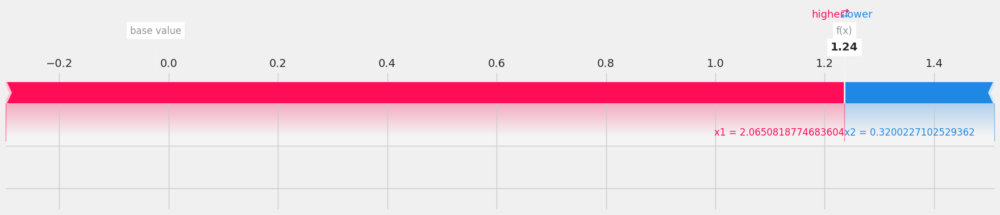

In [39]:
explainer = shap.LinearExplainer(logreg, X_train, feature_dependence="independent")
shap_values = explainer.shap_values(X_test)
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0], X_test[0], feature_names=['x1', 'x2'], matplotlib = True)


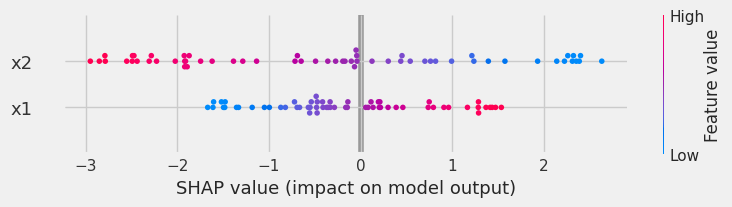

In [40]:
shap.summary_plot(shap_values, X_test, feature_names=['x1', 'x2'])

Pour des données avec des relations non linéaires complexes, comme c'est le cas avec le jeu de données "half-moons", un `KernelExplainer` serait généralement plus adapté qu'un `LinearExplainer`. Cela est dû au fait que `KernelExplainer` est un outil plus flexible qui peut capturer des relations non linéaires entre les caractéristiques et les prédictions, ce qui est essentiel pour les modèles formant des frontières de décision non linéaires.

Résumé avec intégration de `KernelExplainer` :
Les visualisations SHAP utilisant `LinearExplainer` montrent que x1 et x2 ont des influences opposées sur la prédiction d'une classe dans les données "half-moons". Cependant, étant donné la nature non linéaire de ces données, un `KernelExplainer` serait probablement plus approprié pour saisir la complexité du modèle. Il fournit une approximation plus générale qui peut mieux rendre compte de la manière dont les interactions entre les caractéristiques affectent les prédictions sur des jeux de données non linéaires.

Procédons à présent à un type d'explication plus adapté

In [41]:
# Créer un explainer SHAP pour le modèle
explainer = shap.KernelExplainer(logreg.predict_proba, X_train)

In [42]:
shap_values = explainer.shap_values(X_test[0])

divide by zero encountered in double_scalars


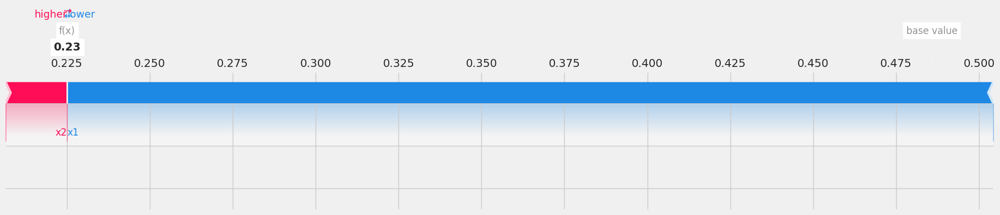

In [43]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0], feature_names=['x1', 'x2'], matplotlib = True)


  0%|          | 0/60 [00:00<?, ?it/s]

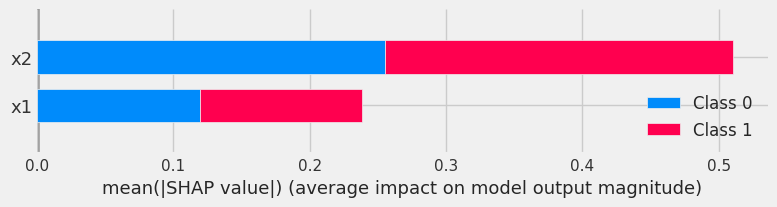

In [44]:
shap_values = explainer.shap_values(X_test)

# Visualiser le résumé des valeurs SHAP
shap.summary_plot(shap_values, X_test, feature_names=['x1', 'x2'])

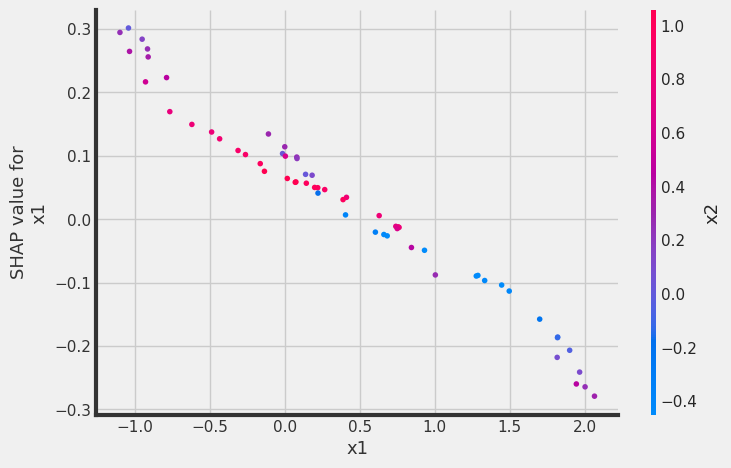

In [45]:
#Pour un dependence plot d'une caractéristique spécifique
shap.dependence_plot("x1", shap_values[0], X_test, feature_names=['x1', 'x2'])

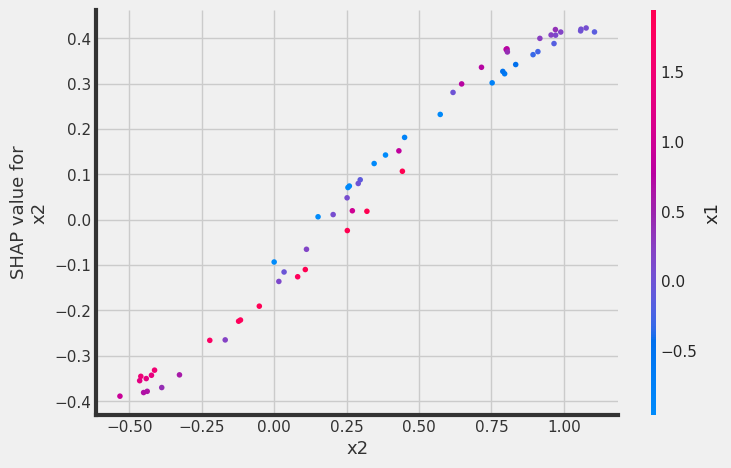

In [46]:
shap.dependence_plot("x2", shap_values[0], X_test, feature_names=['x1', 'x2'])

## 4 - Données textuelles (facultatif)

<div class="alert alert-block alert-warning">
    Apprendre un modèle de classification random forest sur les données <code>fetch_20newsgroups</code> puis utiliser LIME et SHAP pour obtenir des explications sur la classification d'exemples.
</div>

<div class = "alert alert-block alert-info">
À l'aide de la <a href="https://scikit-learn.org/stable/auto_examples/text/plot_document_classification_20newsgroups.html#sphx-glr-auto-examples-text-plot-document-classification-20newsgroups-py">documentation du dataset fetch_20newsgroups</a>,  apprendre un modèle random forest de classification bi-classe de texte.
</div>

Dans cette section, nous revisiterons le code que nous avons développé lors du TME 3 pour obtenir des explications sur la classification d'exemples grâce à LIME mais aussi SHAP

In [91]:
#import du dataset
from sklearn.datasets import fetch_20newsgroups

#On souhaite apprendre un modèle de classification bi-classe (donc 2 catégories)
categories = ["alt.atheism","sci.space"]

#Données de train
data_train = fetch_20newsgroups(
    subset='train',
    categories = categories,
    shuffle = True,
    random_state = 42,
)

#Données de test
data_test = fetch_20newsgroups(
    subset='test',
    categories = categories,
    shuffle = True,
    random_state = 42,
)

target_names = data_train.target_names
target_names

['alt.atheism', 'sci.space']

In [92]:
#split target en train et test
y_train, y_test = data_train.target, data_test.target

In [93]:
#Extracting features from the training data and testing data using vectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(sublinear_tf = True, max_df = 0.5, min_df=5, stop_words="english")

X_train = vectorizer.fit_transform(data_train.data)
X_test = vectorizer.transform(data_test.data)

In [94]:
#Apprentissage random forest
rf = RandomForestClassifier(n_estimators = 1000).fit(X_train, y_train)
y_pred = rf.predict(X_test)

In [95]:
print("Test  Accuracy : %.2f"%rf.score(X_test, y_test))
print("Train Accuracy : %.2f"%rf.score(X_train, y_train))
print()
print("Confusion Matrix : ")
print(confusion_matrix(y_test, rf.predict(X_test)))
print()
print("Classification Report")
print(classification_report(y_test, rf.predict(X_test)))

Test  Accuracy : 0.96
Train Accuracy : 1.00

Confusion Matrix : 
[[291  28]
 [  4 390]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.91      0.95       319
           1       0.93      0.99      0.96       394

    accuracy                           0.96       713
   macro avg       0.96      0.95      0.95       713
weighted avg       0.96      0.96      0.95       713



<div class = "alert alert-block alert-info">
Utilisez LIME et SHAP pour obtenir des explications sur les prédictions obtenues sur des exemples.
    </div>

#### LIME
Commençons par utiliser LIME pour obtenir des explications sur les prédictions obtenues

In [96]:
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline

pipeline = make_pipeline(vectorizer, rf)
explainer = LimeTextExplainer(class_names = categories)

#Pour un autre exemple
exp = explainer.explain_instance(data_test.data[50], pipeline.predict_proba)
print('P(atheism)  de l exemple =', rf.predict_proba(X_test[50])[0][0])
print('classe prédite =',y_pred[50])
print("Actual classe", y_test[50])

exp.show_in_notebook(text=True)

P(atheism)  de l exemple = 0.755
classe prédite = 0
Actual classe 0


#### SHAP
Intéressons nous à présent à l'utilisation de SHAP pour générer des explications



In [97]:
shap.initjs()

In [98]:
#Le mieux est d'initialiser un TreeExplainer SHAP avec notre random forest model
explainer = shap.TreeExplainer(rf)
explainer

In [99]:
# Convertir les données TF-IDF en un format compatible avec SHAP
X_test_array = X_test[:10].toarray()  # Convertir en un tableau numpy dense

# Initialiser un conteneur pour les valeurs SHAP
shap_values = np.zeros((2, X_test_array.shape[0], X_test_array.shape[1]))  # 2 pour les deux classes

# Calculer les valeurs SHAP pour chaque échantillon individuellement avec une barre de progression
for i in tqdm(range(X_test_array.shape[0])):
    values = explainer.shap_values(X_test_array[i])
    for j in range(len(values)):  # Itérer sur les classes
        shap_values[j][i] = values[j]

100%|██████████| 10/10 [00:04<00:00,  2.34it/s]


Voir l'importance des features pour la première classe

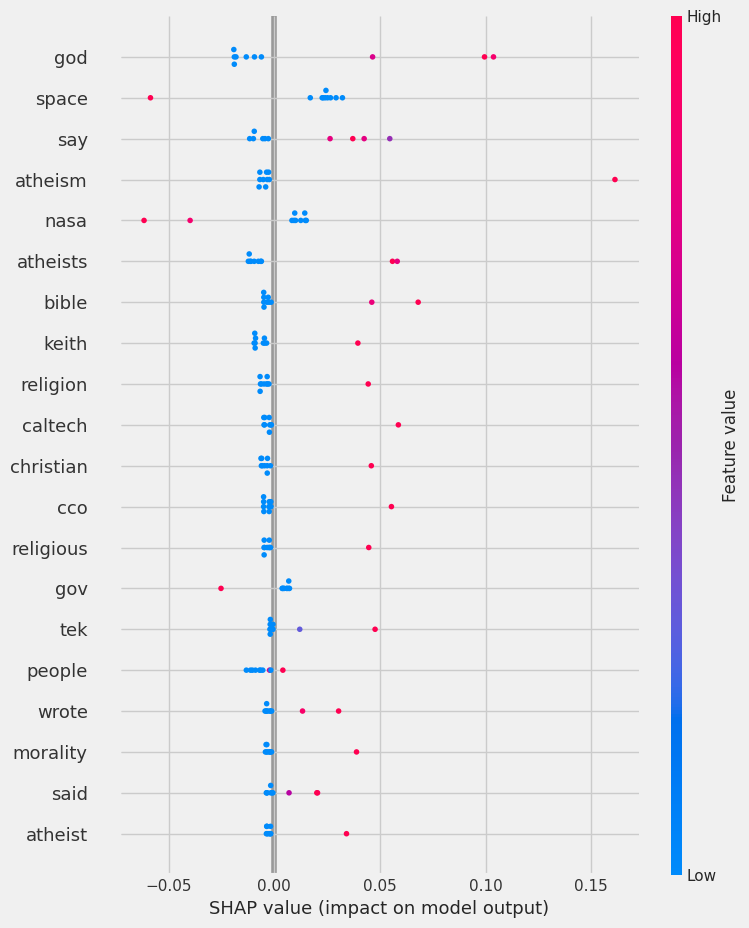

In [100]:
shap.summary_plot(shap_values[0], X_test_array, feature_names=vectorizer.get_feature_names_out())

Et maintenant pour la seconde

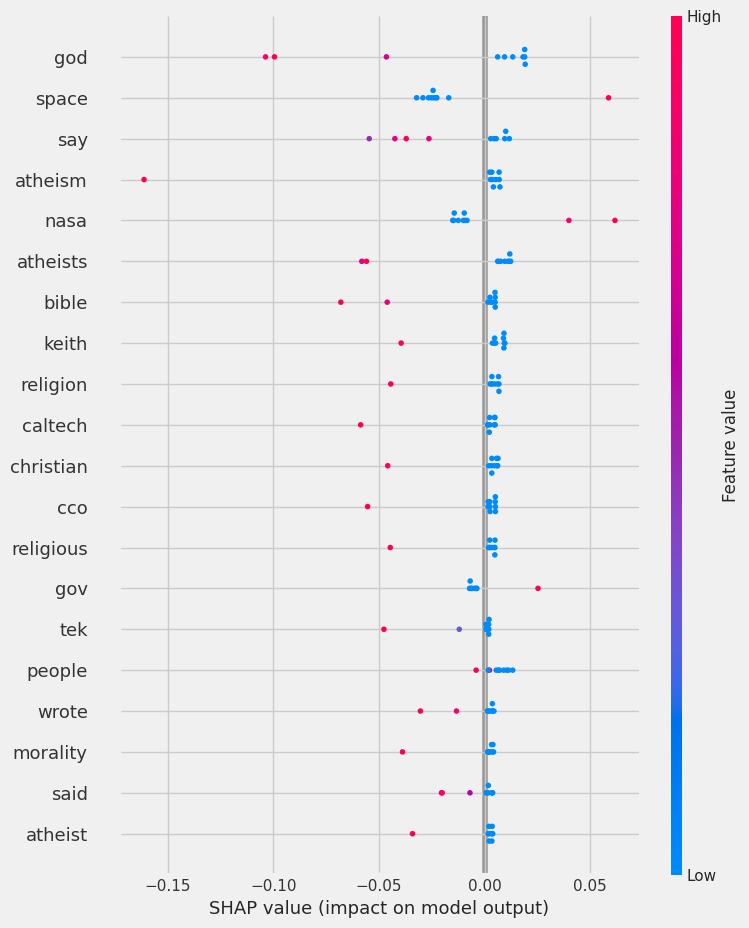

In [101]:
shap.summary_plot(shap_values[1], X_test_array, feature_names=vectorizer.get_feature_names_out())

Passons à la génération d'autres types d'explications globales

In [102]:
i

9

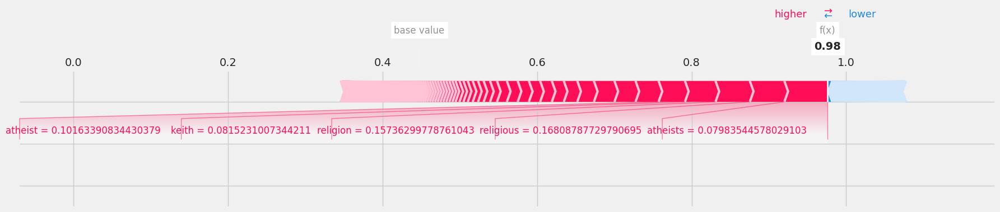

In [103]:
shap.force_plot(explainer.expected_value[0], shap_values[0][i], X_test_array[i], feature_names=vectorizer.get_feature_names_out(), matplotlib = True)


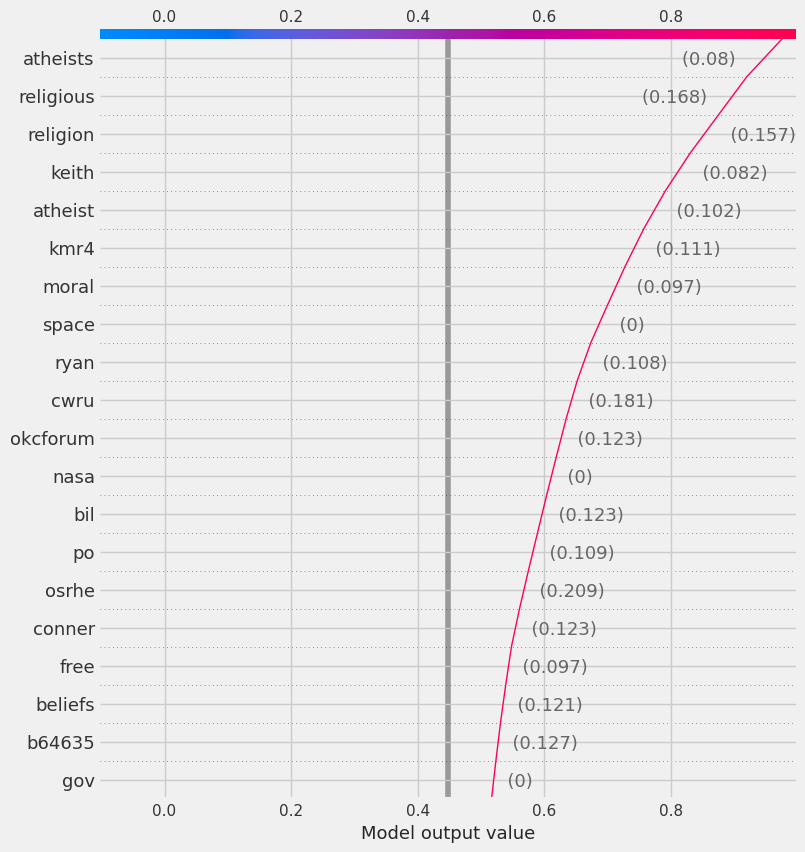

In [104]:
shap.decision_plot(explainer.expected_value[0], shap_values[0][i], X_test_array[i], feature_names=vectorizer.get_feature_names_out())

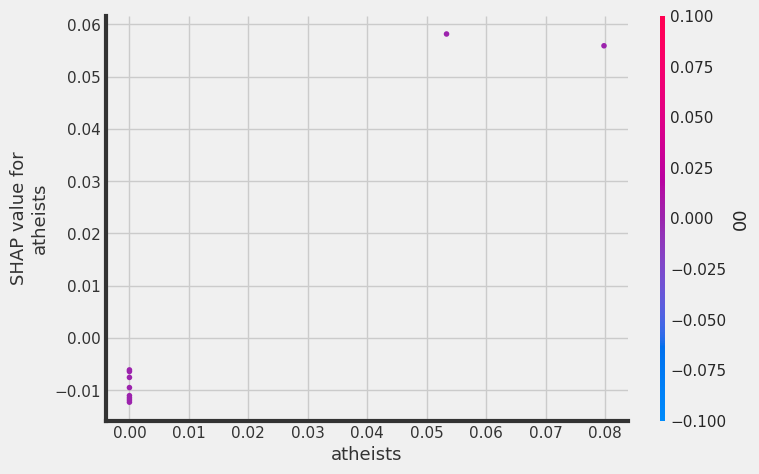

In [105]:
shap.dependence_plot("atheists", shap_values[0], X_test_array, feature_names=vectorizer.get_feature_names_out())


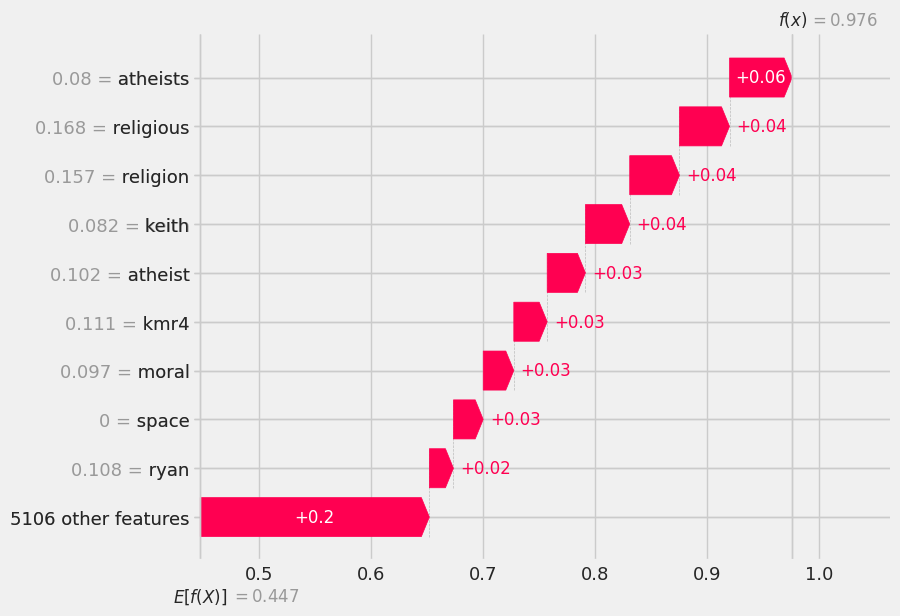

In [106]:
# Création d'un objet Explanation pour l'échantillon spécifique
shap_explanation = shap.Explanation(values=shap_values[0][i],
                                    base_values=explainer.expected_value[0],
                                    data=X_test_array[i],
                                    feature_names=vectorizer.get_feature_names_out())

# Utilisation du waterfall plot avec l'objet Explanation
shap.waterfall_plot(shap_explanation)
